In [342]:
# get clamp pose point in the image
#-> camera 

In [343]:
from pathlib import Path
from PIL import Image, ImageDraw
import json
import numpy as np

In [344]:
dataset_path = Path("/media/Data/Data/DavidDylan/tracebotreal/train/000001")
clamp_ids = [9, 10]
tube_id = 11



In [345]:
rgb_path = dataset_path/"rgb"
visib_mask_path = dataset_path/"mask_visib"
scene_gt_json_path = dataset_path/"scene_gt.json"
scene_gt_info_json_path = dataset_path/"scene_gt_info.json"
camera_json_path = dataset_path/"camera.json"

gt_json = json.load(open(scene_gt_json_path))
camera_json = json.load(open(camera_json_path))
scene_gt_info_json = json.load(open(scene_gt_info_json_path))

cx = camera_json['cx']
cy = camera_json['cy']
fx = camera_json['fx']
fy = camera_json['fy']

camera_intrinsics = np.array([[fx, 0, cx], [0, fy, cy], [0, 0, 1]])

In [346]:
def project_3d_to_2d(point_3d, intrinsic_matrix):
    point_2d_homo = intrinsic_matrix @ point_3d
    u = point_2d_homo[0] / point_2d_homo[2]
    v = point_2d_homo[1] / point_2d_homo[2]
    return u, v

def scale_bounding_box(bbox, scale, img_width, img_height):
    x, y, width, height = bbox
    
    new_width = np.round(width * scale).astype(int)
    new_height = np.round(height * scale).astype(int)

    center_x = x + width / 2
    center_y = y + height / 2

    new_x = np.round(center_x - new_width / 2).astype(int)
    new_y = np.round(center_y - new_height / 2).astype(int)

    if new_x < 0:
        new_width += new_x  # Adjust width if left side goes out of bounds
        new_x = 0
    if new_y < 0:
        new_height += new_y  # Adjust height if top side goes out of bounds
        new_y = 0
    if new_x + new_width > img_width:
        new_width = img_width - new_x  # Adjust width if right side goes out of bounds
    if new_y + new_height > img_height:
        new_height = img_height - new_y  # Adjust height if bottom side goes out of bounds

    return [new_x, new_y, new_width, new_height]

def distance_to_scale(distance):
    distance /=1000
    # all scales >1 the closer (smaller distance) the bigger the scale
    scale = 1 / (distance + 1) + 2
    return scale

def bop_to_pil_rectangle(bbox):
    x = bbox[0]
    y = bbox[1]
    width = bbox[2]
    height = bbox[3]
    return [x, y, x+width, y+height]

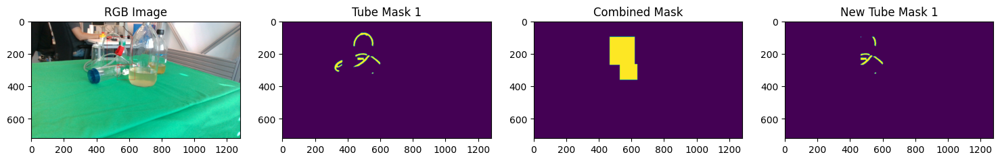

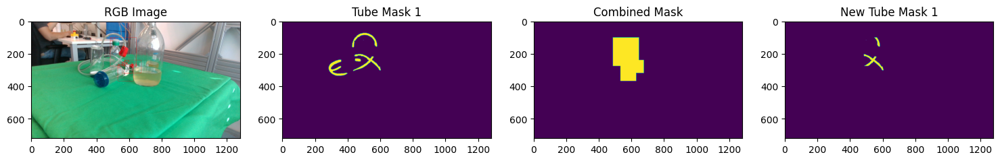

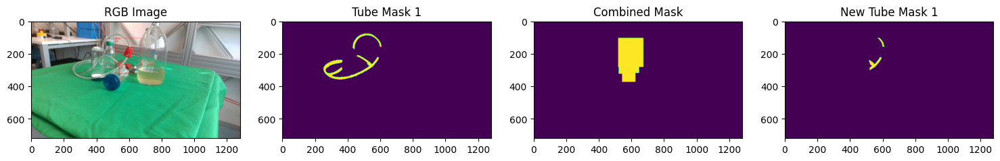

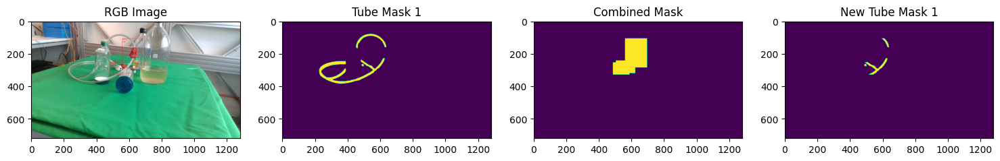

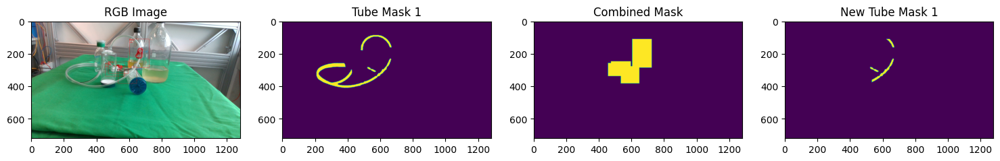

...

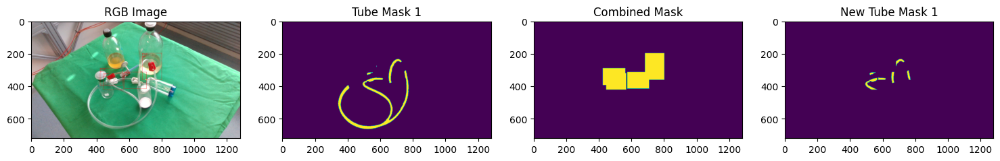

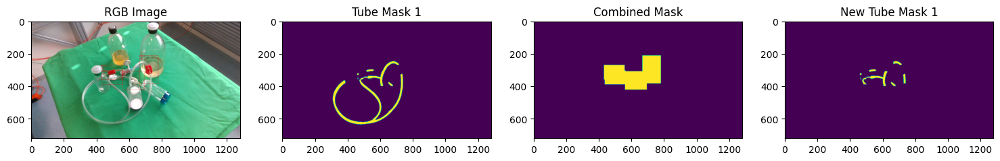

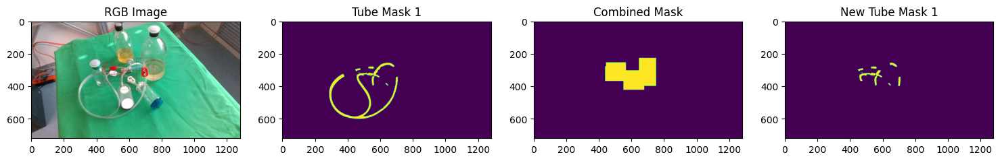

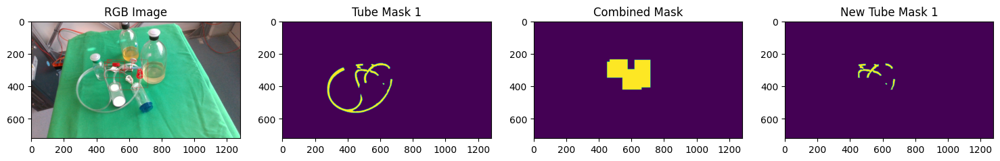

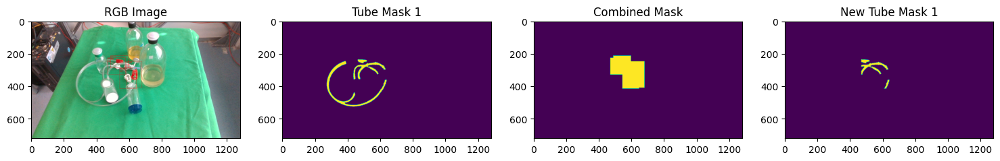

In [347]:
img_width = camera_json['width']
img_height =camera_json['height']
debug=True

for ii, rgb_file in enumerate(sorted(rgb_path.glob("*.png"))):
    ii = str(ii)
    clamp_indices = [i for i, clamp_id in enumerate(gt_json[ii]) if clamp_id["obj_id"] in clamp_ids]
    tube_indices = [i for i, clamp_id in enumerate(gt_json[ii]) if int(clamp_id["obj_id"]) == tube_id]
    clamp_translations = [gt_json[ii][i]["cam_t_m2c"] for i in clamp_indices]
    clamp_distances = [np.linalg.norm(translation) for translation in clamp_translations]
    clamp_bboxes = [scene_gt_info_json[ii][i]["bbox_obj"] for i in clamp_indices]

    scales = [distance_to_scale(distance) for distance in clamp_distances]

    rgb = Image.open(rgb_file)
    draw = ImageDraw.Draw(rgb)
    for i, (translation, distance, bbox, scale) in enumerate(zip(clamp_translations, clamp_distances, clamp_bboxes, scales)):
        bbox = scale_bounding_box(bbox, scale, img_width, img_height)
        bbox = bop_to_pil_rectangle(bbox)
        draw.rectangle(bbox, outline="red")
        draw.text((bbox[0], bbox[1] + 0), f"{distance:.2f}", fill="red")
        draw.text((bbox[0], bbox[1] + 15), f"{scale:.2f}", fill="red")
    np_rgb = np.array(rgb)

    tube_visib_masks = []
    for i in tube_indices:
        tube_visib_mask = Image.open(visib_mask_path/f"{int(ii):06d}_{i:06d}.png")
        tube_visib_masks.append(np.array(tube_visib_mask))

    # create mask from all the clamp bounding boxes
    mask = np.zeros_like(tube_visib_masks[0])
    for bbox, scale in zip(clamp_bboxes, scales):
        bbox = scale_bounding_box(bbox, scale, img_width, img_height)
        x, y, width, height = bbox
        mask[y:y+height, x:x+width] = 1

    new_tube_masks = [tube_mask & mask for tube_mask in tube_visib_masks]

    if debug:
        import matplotlib.pyplot as plt
        # Create a figure with subplots
        num_subplots = len(tube_visib_masks) + 3  # tube masks + mask + new_tube_masks + rgb
        fig, axes = plt.subplots(1, num_subplots, figsize=(15, 15))

        # Plot the RGB image
        axes[0].imshow(np_rgb)
        axes[0].set_title("RGB Image")

        # Plot the tube visibility masks
        for i, tube_mask in enumerate(tube_visib_masks):
            axes[i + 1].imshow(tube_mask)
            axes[i + 1].set_title(f"Tube Mask {i + 1}")

        # Plot the combined mask
        axes[len(tube_visib_masks) + 1].imshow(mask)
        axes[len(tube_visib_masks) + 1].set_title("Combined Mask")

        # Plot the new tube masks
        for i, new_tube_mask in enumerate(new_tube_masks):
            axes[i + len(tube_visib_masks) + 2].imshow(new_tube_mask)
            axes[i + len(tube_visib_masks) + 2].set_title(f"New Tube Mask {i + 1}")

        plt.tight_layout()  # Adjust layout for better spacing
        plt.show()
